In [0]:
from pyspark.sql.functions import col, to_date, avg, expr, sum
import statsmodels.api as sm 

Prompt: read to spark from table "default.monthly_hourly_load_values_2023"

In [0]:
# Read the table into Spark
df_load = spark.read.table("default.monthly_hourly_load_values_2023")

In [0]:
df_load.display()

MeasureItem,DateUTC,DateShort,TimeFrom,TimeTo,CountryCode,Cov_ratio,Value,Value_ScaleTo100,CreateDate,UpdateDate
Monthly Hourly Load Values,01-01-2023 00:00,2023-01-01,2024-03-07T00:00:00Z,2024-03-07T01:00:00Z,AL,100,161,161,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 01:00,2023-01-01,2024-03-07T01:00:00Z,2024-03-07T02:00:00Z,AL,100,138,138,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 02:00,2023-01-01,2024-03-07T02:00:00Z,2024-03-07T03:00:00Z,AL,100,124,124,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 03:00,2023-01-01,2024-03-07T03:00:00Z,2024-03-07T04:00:00Z,AL,100,119,119,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 04:00,2023-01-01,2024-03-07T04:00:00Z,2024-03-07T05:00:00Z,AL,100,121,121,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 05:00,2023-01-01,2024-03-07T05:00:00Z,2024-03-07T06:00:00Z,AL,100,132,132,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 06:00,2023-01-01,2024-03-07T06:00:00Z,2024-03-07T07:00:00Z,AL,100,156,156,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 07:00,2023-01-01,2024-03-07T07:00:00Z,2024-03-07T08:00:00Z,AL,100,188,188,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 08:00,2023-01-01,2024-03-07T08:00:00Z,2024-03-07T09:00:00Z,AL,100,208,208,01-12-2023 15:51:48,01-12-2023 15:51:48
Monthly Hourly Load Values,01-01-2023 09:00,2023-01-01,2024-03-07T09:00:00Z,2024-03-07T10:00:00Z,AL,100,214,214,01-12-2023 15:51:48,01-12-2023 15:51:48


Prompt: create a column with the date from column DateUTC 

(worked in a second iteration after copying specification on datetime from the docu suggested by the AI)

In [0]:

df_load = df_load.withColumn("Date", to_date(col("DateUTC"),"dd-MM-yyyy HH:mm"))

In [0]:
df_load.filter(col("CountryCode")=="AT").display()

MeasureItem,DateUTC,DateShort,TimeFrom,TimeTo,CountryCode,Cov_ratio,Value,Value_ScaleTo100,CreateDate,UpdateDate,Date
Monthly Hourly Load Values,01-01-2023 00:00,2023-01-01,2024-03-07T00:00:00Z,2024-03-07T01:00:00Z,AT,100,"5280,8","5280,8",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 01:00,2023-01-01,2024-03-07T01:00:00Z,2024-03-07T02:00:00Z,AT,100,5143,5143,01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 02:00,2023-01-01,2024-03-07T02:00:00Z,2024-03-07T03:00:00Z,AT,100,"4958,7","4958,7",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 03:00,2023-01-01,2024-03-07T03:00:00Z,2024-03-07T04:00:00Z,AT,100,"4905,4","4905,4",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 04:00,2023-01-01,2024-03-07T04:00:00Z,2024-03-07T05:00:00Z,AT,100,"5025,8","5025,8",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 05:00,2023-01-01,2024-03-07T05:00:00Z,2024-03-07T06:00:00Z,AT,100,"5163,4","5163,4",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 06:00,2023-01-01,2024-03-07T06:00:00Z,2024-03-07T07:00:00Z,AT,100,"5439,5","5439,5",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 07:00,2023-01-01,2024-03-07T07:00:00Z,2024-03-07T08:00:00Z,AT,100,"5696,1","5696,1",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 08:00,2023-01-01,2024-03-07T08:00:00Z,2024-03-07T09:00:00Z,AT,100,"5847,1","5847,1",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01
Monthly Hourly Load Values,01-01-2023 09:00,2023-01-01,2024-03-07T09:00:00Z,2024-03-07T10:00:00Z,AT,100,"5884,5","5884,5",01-12-2023 15:51:48,01-12-2023 15:51:48,2023-01-01


In [0]:
df_load_daily=df_load.filter(col("CountryCode")=="AT").groupBy(col("Date")).agg(avg("Value"))

Prompt: plot me the time series of df_load_daily this means you first need to sort date ascending

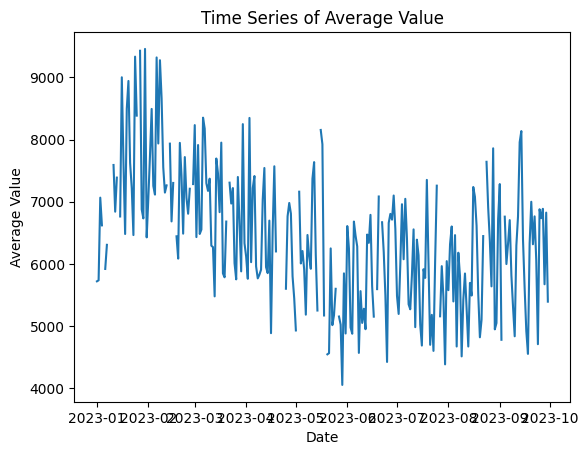

In [0]:
import matplotlib.pyplot as plt

# Sort the date column in ascending order
df_load_daily = df_load_daily.orderBy(col("Date"))

# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_load_daily.toPandas()

# Plot the time series
plt.plot(df_pandas["Date"], df_pandas["avg(Value)"])
plt.xlabel("Date")
plt.ylabel("Average Value")
plt.title("Time Series of Average Value")
plt.show()# Sort date column in ascending order
df_load_daily = df_load_daily.orderBy(col("Date"))


Use plotly express to show me a nice map of the average load per country from the df_load dataset.

In [0]:
import plotly.express as px

df_avg_load_country = df_load.groupBy("CountryCode").agg(avg("Value").alias("Average Load"))

fig = px.choropleth(df_avg_load_country.toPandas(),
                    locations="CountryCode",
                    locationmode="ISO-3",
                    color="AvgLoad",
                    title="Average Load per Country",
                    hover_name="AvgLoad",
                    color_continuous_scale="Viridis")

fig.show()

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
File <command-4199711321168259>, line 5
      1 import plotly.express as px
      3 df_avg_load_country = df_load.groupBy("CountryCode").agg(avg("Value").alias("Average Load"))
----> 5 fig = px.choropleth(df_avg_load_country.toPandas(),
      6                     locations="CountryCode",
      7                     locationmode="ISO-3",
      8                     color="AvgLoad",
      9                     title="Average Load per Country",
     10                     hover_name="AvgLoad",
     11                     color_continuous_scale="Viridis")
     13 fig.show()

File /databricks/python/lib/python3.10/site-packages/plotly/express/_chart_types.py:1091, in choropleth(data_frame, lat, lon, locations, locationmode, geojson, featureidkey, color, facet_row, facet_col, facet_col_wrap, facet_row_spacing, facet_col_spacing, hover_name, 

In [0]:
df_avg_load_country.display()

CountryCode,Average Load
EE,886.6269113149847
CZ,7136.063492063492
DE,53344.5
CH,7041.666666666667
BG,4019.6507936507937
DK,3722.2083333333335
LT,1276.6615384615384
HR,2062.052064631957
GR,5588.9160561660565
IT,31755.84249084249


In [0]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Create a GeoDataFrame from the average load per country DataFrame
gdf_avg_load_country = gpd.GeoDataFrame(df_avg_load_country,
                                         geometry=gpd.points_from_xy(df_avg_load_country["Longitude"],
                                                                    df_avg_load_country["Latitude"]))

# Load the world map shapefile
world_map = gpd.read_file("path/to/world_map.shp")

# Merge the average load per country GeoDataFrame with the world map shapefile
merged = world_map.merge(gdf_avg_load_country, left_on="iso_a3", right_on="CountryCode", how="left")

# Plot the merged GeoDataFrame
fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title("Average Load per Country")
merged.plot(column="AvgLoad", cmap="YlOrRd", linewidth=0.8, ax=ax, edgecolor="0.8", legend=True)
plt.show()

---------------------------------------------------------------------------
ModuleNotFoundError                       Traceback (most recent call last)
File <command-4199711321168266>, line 1
----> 1 import geopandas as gpd
      2 import matplotlib.pyplot as plt
      4 # Create a GeoDataFrame from the average load per country DataFrame

ModuleNotFoundError: No module named 'geopandas'

In [0]:
import plotly.express as px

# Group by country and calculate the average load
df_avg_load_country = df_load.groupBy("CountryCode").agg(avg("Value").alias("AvgLoad"))

# Create a choropleth map using Plotly
fig = px.choropleth(df_avg_load_country.toPandas(),
                    locations="CountryCode",
                    locationmode="ISO-3",
                    color="AvgLoad",
                    title="Average Load per Country",
                    hover_name="AvgLoad",
                    color_continuous_scale="Viridis")

fig.show()

## weather data

In [0]:
df_weather = spark.read.table("default.vienna_weather_2023")

In [0]:
df_weather.display()

name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,precipcover,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
Vienna,2023-01-01,10.1,2.3,6.6,10.1,0.5,6.0,5.0,89.7,0.0,0,0.0,null,null,null,null,7.2,185.6,1025.7,54.3,9.9,46.8,4.0,2,null,2023-01-01T07:45:20Z,2023-01-01T16:10:48Z,0.31,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,11030099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-02,6.6,5.0,5.6,6.0,2.9,4.5,5.3,97.4,0.0,0,0.0,null,null,null,null,14.4,174.1,1025.1,94.0,2.7,11.3,0.9,1,null,2023-01-02T07:45:19Z,2023-01-02T16:11:47Z,0.35,Overcast,Cloudy skies throughout the day.,cloudy,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-03,11.1,4.3,7.7,11.1,2.6,7.1,5.3,85.3,0.0,0,0.0,null,null,null,null,14.4,280.7,1029.5,95.9,22.6,26.3,2.2,1,null,2023-01-03T07:45:14Z,2023-01-03T16:12:48Z,0.38,Overcast,Cloudy skies throughout the day.,cloudy,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-04,13.1,3.6,8.2,13.1,1.7,7.9,4.6,78.9,0.3,100,4.17,rain,null,null,46.8,21.6,239.0,1027.7,58.8,17.4,53.6,4.6,3,null,2023-01-04T07:45:07Z,2023-01-04T16:13:52Z,0.41,"Rain, Partially cloudy",Partly cloudy throughout the day with late afternoon rain.,rain,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-05,13.8,10.1,12.0,13.8,10.1,12.0,6.3,68.5,3.003,100,4.17,rain,null,null,75.6,36.0,277.6,1017.9,53.1,46.5,38.3,3.3,3,null,2023-01-05T07:44:56Z,2023-01-05T16:14:57Z,0.45,"Rain, Partially cloudy",Partly cloudy throughout the day with afternoon rain.,rain,"11036099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-06,12.5,7.2,10.6,12.5,5.9,10.2,5.9,72.9,0.0,0,0.0,null,null,null,50.5,18.0,252.7,1022.9,75.9,35.5,34.5,2.9,2,null,2023-01-06T07:44:43Z,2023-01-06T16:16:04Z,0.48,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,11030099999,D4277,11378099999,11813099999,11034099999,11082099999,11182099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-07,11.6,6.1,9.7,11.6,3.9,9.1,5.6,76.1,0.0,0,0.0,null,null,null,null,14.4,158.8,1020.7,50.0,47.2,45.2,3.9,3,null,2023-01-07T07:44:26Z,2023-01-07T16:17:14Z,0.5,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-08,5.6,3.8,4.7,4.1,0.4,2.4,3.5,92.0,0.0,0,0.0,null,null,null,null,14.4,169.6,1013.3,87.9,8.0,9.1,0.8,0,null,2023-01-08T07:44:07Z,2023-01-08T16:18:25Z,0.55,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-09,9.1,2.6,6.5,8.2,0.6,4.3,3.3,80.9,1.796,100,25.0,rain,null,null,64.8,25.2,278.8,1004.9,99.4,26.4,10.8,1.0,1,null,2023-01-09T07:43:45Z,2023-01-09T16:19:38Z,0.58,"Rain, Overcast",Cloudy skies throughout the day with a chance of rain throughout the day.,rain,"F1957,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"
Vienna,2023-01-10,8.8,6.5,7.4,5.5,2.5,3.9,1.9,68.6,1.699,100,25.0,rain,null,null,64.8,28.8,312.4,1015.9,93.5,34.3,27.9,2.4,2,null,2023-01-10T07:43:20Z,2023-01-10T16:20:53Z,0.62,"Rain, Overcast",Cloudy skies throughout the day with rain clearing later.,rain,"F1957,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999"


In [0]:
df_weather = df_weather.withColumn("Date", to_date(col("datetime"),"yyyy-MM-dd"))

prompt: plot me the time series of the variable temp of df_weather this means you first need to sort datetime field ascending

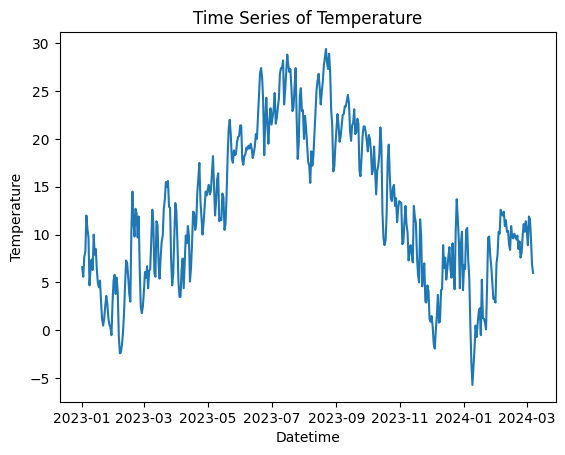

In [0]:
import matplotlib.pyplot as plt

# Sort the DataFrame by datetime in ascending order
df_weather_sorted = df_weather.sort("datetime")

# Extract the datetime and temp columns
datetime = df_weather_sorted.select("datetime").rdd.flatMap(lambda x: x).collect()
temp = df_weather_sorted.select("temp").rdd.flatMap(lambda x: x).collect()

# Plot the time series of temp
plt.plot(datetime, temp)
plt.xlabel("Datetime")
plt.ylabel("Temperature")
plt.title("Time Series of Temperature")
plt.show()

prompt: plot me the time series of the variable temp of df_weather this means you first need to sort datetime field ascending. use plotly

In [0]:
import plotly.graph_objects as go

# Sort the DataFrame by datetime in ascending order
df_weather_sorted = df_weather.sort("datetime")

# Extract the datetime and temp columns
datetime = df_weather_sorted.select("datetime").rdd.flatMap(lambda x: x).collect()
temp = df_weather_sorted.select("temp").rdd.flatMap(lambda x: x).collect()

# Create a line plot using Plotly
fig = go.Figure(data=go.Scatter(x=datetime, y=temp))
fig.update_layout(title="Time Series of Temperature",
                  xaxis_title="Datetime",
                  yaxis_title="Temperature")
fig.show()

## join data

prompt: Join me the datasets weather and load by date

In [0]:
# Join the weather and load datasets by date
df_combined = df_weather.join(df_load_daily, "Date", "inner")

In [0]:
df_combined.display()

Date,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,precipcover,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations,avg(Value)
2023-06-22,Vienna,2023-06-22,32.1,20.3,26.4,33.1,20.3,27.1,18.7,64.6,0.0,0,0.0,null,null,null,null,18.0,127.4,1016.9,66.1,34.9,295.5,25.7,8,null,2023-06-22T04:54:14Z,2023-06-22T20:58:49Z,0.14,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",6669.75
2023-07-15,Vienna,2023-07-15,35.1,20.0,26.9,35.2,20.0,27.1,15.8,52.3,0.0,0,0.0,null,null,null,54.0,25.2,142.7,1013.3,3.9,54.4,316.9,27.5,8,null,2023-07-15T05:09:31Z,2023-07-15T20:50:58Z,0.92,Clear,Clear conditions throughout the day.,clear-day,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",5025.0
2023-05-22,Vienna,2023-05-22,28.3,15.3,22.0,27.5,15.3,21.9,12.8,58.2,0.0,0,0.0,null,null,null,null,14.4,150.3,1014.2,43.7,41.5,312.1,27.0,9,null,2023-05-22T05:07:28Z,2023-05-22T20:35:42Z,0.09,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",6249.333333333333
2023-09-14,Vienna,2023-09-14,24.1,19.1,20.9,24.1,19.1,20.9,15.3,71.6,2.493,100,20.83,rain,null,null,50.4,21.6,315.2,1018.5,68.3,32.7,107.0,9.2,4,null,2023-09-14T06:29:28Z,2023-09-14T19:10:10Z,0.98,"Rain, Partially cloudy",Partly cloudy throughout the day with rain clearing later.,rain,"11036099999,LOWW,11382099999,11813099999,11034099999,11080099999,11035099999,11040099999,11190099999,D4277,11078099999,11082099999,11182099999,11032099999,11037099999",8136.0
2023-02-25,Vienna,2023-02-25,10.8,3.1,6.4,10.8,-0.7,2.7,0.7,68.4,5.094,100,20.83,rain,null,null,82.7,36.0,276.3,1001.8,54.6,38.5,135.8,11.7,6,null,2023-02-25T06:44:10Z,2023-02-25T17:31:54Z,0.17,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,"11036099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",6807.0
2023-06-18,Vienna,2023-06-18,29.0,15.1,22.2,27.7,15.1,22.1,10.9,51.1,0.0,0,0.0,null,null,null,null,14.4,179.2,1014.8,11.5,26.2,329.8,28.4,9,null,2023-06-18T04:53:37Z,2023-06-18T20:57:48Z,0.0,Clear,Clear conditions throughout the day.,clear-day,"11036099999,11382099999,LOWW,11378099999,11813099999,11034099999,11035099999,11040099999,11385099999,11190099999,D4277,11082099999,12805099999,11380099999,11389099999",null
2023-09-19,Vienna,2023-09-19,25.0,17.6,20.5,25.0,17.6,20.5,14.1,67.7,6.687,100,25.0,rain,null,null,54.0,25.2,272.3,1013.7,61.9,30.4,139.8,12.0,7,null,2023-09-19T06:36:22Z,2023-09-19T18:59:43Z,0.15,"Rain, Partially cloudy",Partly cloudy throughout the day with rain clearing later.,rain,"LOWW,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",6326.5
2023-02-08,Vienna,2023-02-08,1.5,-4.2,-1.5,0.1,-6.9,-3.5,-6.5,68.8,0.0,0,0.0,null,null,null,null,10.8,180.1,1043.2,24.0,17.7,73.0,6.3,3,null,2023-02-08T07:13:23Z,2023-02-08T17:04:43Z,0.59,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",9276.0
2023-06-23,Vienna,2023-06-23,27.3,19.0,23.9,29.6,19.0,24.2,16.6,65.0,7.786,100,25.0,rain,null,null,75.6,36.0,276.1,1015.3,88.3,38.3,157.5,13.6,7,null,2023-06-23T04:54:29Z,2023-06-23T20:58:58Z,0.17,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,"11036099999,LOWW,D4277,11034099999,11082099999,11080099999,AU094,11035099999,11040099999,11037099999",6188.4
2023-03-12,Vienna,2023-03-12,9.1,1.1,5.6,8.6,-1.6,3.5,-4.4,49.6,0.0,0,0.0,null,null,null,null,14.4,261.2,1015.9,73.5,49.8,127.8,10.8,6,null,2023-03-12T06:14:41Z,2023-03-12T17:54:53Z,0.67,Partially cloudy,Partly cloudy throughout the day.,partly-

In [0]:
# Rename the column 'avg(Value)' to 'load'
df_combined = df_combined.withColumnRenamed('avg(Value)', 'load')

## Explore the relationship between load and temperature

prompt: Show me the relationship between temperature (temp) and load in a plotly graph. Exclude weekends and public holidays. Fit an STR model with NLS and display the line in red. 

remove the NAs when fitting the model.

In [0]:
# Filter out weekends, public holidays, and NAs
df_filtered = df_combined.filter("DAYOFWEEK(Date) NOT IN (1, 7) AND load IS NOT NULL AND temp IS NOT NULL")

# Convert Spark dataframe to Pandas dataframe
df_pandas = df_filtered.select('temp', 'load').na.drop().toPandas()

# Plot the relationship between temperature and load
fig = px.scatter(df_pandas, x='temp', y='load', title='Temperature vs Load')

# Fit an STR model with NLS and remove NAs
x = df_pandas['temp'].dropna()
y = df_pandas['load'].dropna()
x = sm.add_constant(x)  # Add a constant term to the regression equation
model = sm.OLS(y, x).fit()  # Fit the STR model using Ordinary Least Squares
predictions = model.predict(x)  # Get the predicted values from the model

# Display the line in red
fig.add_trace(go.Scatter(x=x['temp'], y=predictions, mode='lines', line=dict(color='red')))

fig.show()

prompt: Show me the relationship between temperature (temp) and load in a plotly graph. Exclude weekends and public holidays. Fit an LSTR model and display the line in red.

In [0]:
# Filter out weekends and public holidays and remove null values
df_filtered = df_combined.filter("DAYOFWEEK(Date) NOT IN (1, 7) AND load IS NOT NULL AND temp IS NOT NULL")

# Convert Spark dataframe to Pandas dataframe
df_pandas = df_filtered.select('temp', 'load').na.drop().toPandas()

# Plot the relationship between temperature and load
fig = px.scatter(df_pandas, x='temp', y='load', title='Temperature vs Load')

# Fit an LSTR model using Pandas and remove null values
x = df_pandas['temp'].dropna()
y = df_pandas['load'].dropna()
x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions = model.predict(x)

# Display the line in red
fig.add_trace(go.Scatter(x=x['temp'], y=predictions, mode='lines', line=dict(color='red')))

fig.show()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-737746979506992>, line 13
     11 x = df_pandas['temp'].dropna()
     12 y = df_pandas['load'].dropna()
---> 13 x = sm.add_constant(x)
     14 model = sm.OLS(y, x).fit()
     15 predictions = model.predict(x)

NameError: name 'sm' is not defined

In [0]:
# Find the maximum temperature in the weather dataset
max_temp = df_weather.agg({"temp": "max"}).collect()[0][0]

In [0]:
max_temp

29.4

prompt: Show me the relationship between temperature (temp) and load in a plotly graph. Exclude weekends and public holidays. Fit a non-linear model and display the line in red.

In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Filter data to exclude weekends and public holidays
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')") \
                        .filter("`date` NOT IN (SELECT `date` FROM df_holidays)")

# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "load").toPandas()

# Fit non-linear model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas["load"]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot temperature vs load with non-linear regression line in red
fig = px.scatter(df_pandas, x="temp", y="load")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred, mode='lines', name='Regression Line', line=dict(color='red')))

fig.show()

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-737746979506999>, line 10
      6 from sklearn.preprocessing import PolynomialFeatures
      8 # Filter data to exclude weekends and public holidays
      9 df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')") \
---> 10                         .filter("`date` NOT IN (SELECT `date` FROM df_holidays)")
     12 # Convert Spark DataFrame to Pandas DataFrame
     13 df_pandas = df_filtered.select("temp", "load").toPandas()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /data

In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Filter data to exclude weekends and public holidays
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')")


# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "load").toPandas()

# Fit non-linear model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas["load"]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot temperature vs load with non-linear regression line in red
fig = px.scatter(df_pandas, x="temp", y="load")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred, mode='lines', name='Regression Line', line=dict(color='red')))

fig.show()

---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
File <command-737746979507000>, line 21
     19 X_poly = poly.fit_transform(X)
     20 model = LinearRegression()
---> 21 model.fit(X_poly, y)
     23 # Generate prediction line
     24 X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)

File /databricks/python/lib/python3.10/site-packages/mlflow/utils/autologging_utils/safety.py:552, in safe_patch.<locals>.safe_patch_function(*args, **kwargs)
    550     patch_function.call(call_original, *args, **kwargs)
    551 else:
--> 552     patch_function(call_original, *args, **kwargs)
    554 session.state = "succeeded"
    556 try_log_autologging_event(
    557     AutologgingEventLogger.get_logger().log_patch_function_success,
    558     session,
   (...)
    562     kwargs,
    563 )

File /databricks/python/lib/python3.10/site-packages/mlflow/utils/autologging_utils/safety.py:252,

In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Filter data to exclude weekends and public holidays
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')")


# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "load").toPandas().dropna()

# Fit non-linear model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas[["load"]]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot temperature vs load with non-linear regression line in red
fig = px.scatter(df_pandas, x="temp", y="load")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred.flatten(), mode='markers', name='Regression Line', line=dict(color='red')))

fig.show()

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



prompt: Show me the relationship between temperature (temp) and load in a plotly graph. Exclude weekends and public holidays. Fit an Smoothed transition regression model and display the line in red.

In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Filter out weekends and public holidays from the data
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')")

# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "load").toPandas().dropna()

# Fit a smoothed transition regression model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas["load"]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate the prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot temperature vs load with smoothed transition regression line in red
fig = px.scatter(df_pandas, x="temp", y="load")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred, mode='lines', name='Regression Line', line=dict(color='red')))

fig.show()

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



prompt: show above plot with load multiplied by 24. Call the x-axis Temperature and the y-axis Electricity load

In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Filter data to exclude weekends and public holidays
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')")

# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "load").toPandas().dropna()

# Multiply load column by 24
df_pandas['load'] = df_pandas['load'] * 24

# Fit non-linear model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas[["load"]]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot Temperature vs Electricity load with non-linear regression line in red
fig = px.scatter(df_pandas, x="temp", y="load", title="Temperature vs Electricity Load")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred.flatten(), mode='markers', name='Regression Line', line=dict(color='red')))

fig.show()

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



## Explore the relationship between my personal energy consumption and weather

In [0]:
df_anz_load = spark.read.table("default.anz_load")

In [0]:
df_anz_load = df_anz_load.withColumn("Date", to_date(col("Datum"),"yyyy-MM-dd"))
df_anz_load = df_anz_load.drop('Datum')

In [0]:
df_anz_load = df_anz_load.withColumnRenamed('AT0010000000000000001000015162143 (1203177818) - Verbrauch [kWh]', 'consumption')

In [0]:
df_anz_load.display()

consumption,Date
null,2021-03-09
null,2021-03-10
null,2021-03-11
null,2021-03-12
null,2021-03-13
null,2021-03-14
null,2021-03-15
null,2021-03-16
null,2021-03-17
null,2021-03-18


In [0]:
# Convert the consumption column to integer where "," is the decimal separator
df_anz_load = df_anz_load.withColumn("consumption", expr("CAST(REPLACE(consumption, ',', '.') AS INT)"))



In [0]:
import plotly.graph_objects as go

# Sort the DataFrame by datetime in ascending order
df_anz_load_sorted = df_anz_load.sort("Date")

# Extract the datetime and temp columns
datetime = df_anz_load_sorted.select("Date").rdd.flatMap(lambda x: x).collect()
temp = df_anz_load_sorted.select("consumption").rdd.flatMap(lambda x: x).collect()

# Create a line plot using Plotly
fig = go.Figure(data=go.Scatter(x=datetime, y=temp))
fig.update_layout(title="Personal Electricity Consumption",
                  xaxis_title="Date",
                  yaxis_title="Consumption (kWh)")
fig.show()

In [0]:
df_combined = df_weather.join(df_anz_load, "Date", "inner")

In [0]:
df_combined.display()

Date,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,precipcover,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations,consumption
2023-01-01,Vienna,2023-01-01,10.1,2.3,6.6,10.1,0.5,6.0,5.0,89.7,0.0,0,0.0,null,null,null,null,7.2,185.6,1025.7,54.3,9.9,46.8,4.0,2,null,2023-01-01T07:45:20Z,2023-01-01T16:10:48Z,0.31,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,11030099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",26
2023-01-02,Vienna,2023-01-02,6.6,5.0,5.6,6.0,2.9,4.5,5.3,97.4,0.0,0,0.0,null,null,null,null,14.4,174.1,1025.1,94.0,2.7,11.3,0.9,1,null,2023-01-02T07:45:19Z,2023-01-02T16:11:47Z,0.35,Overcast,Cloudy skies throughout the day.,cloudy,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",24
2023-01-03,Vienna,2023-01-03,11.1,4.3,7.7,11.1,2.6,7.1,5.3,85.3,0.0,0,0.0,null,null,null,null,14.4,280.7,1029.5,95.9,22.6,26.3,2.2,1,null,2023-01-03T07:45:14Z,2023-01-03T16:12:48Z,0.38,Overcast,Cloudy skies throughout the day.,cloudy,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",22
2023-01-04,Vienna,2023-01-04,13.1,3.6,8.2,13.1,1.7,7.9,4.6,78.9,0.3,100,4.17,rain,null,null,46.8,21.6,239.0,1027.7,58.8,17.4,53.6,4.6,3,null,2023-01-04T07:45:07Z,2023-01-04T16:13:52Z,0.41,"Rain, Partially cloudy",Partly cloudy throughout the day with late afternoon rain.,rain,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",23
2023-01-05,Vienna,2023-01-05,13.8,10.1,12.0,13.8,10.1,12.0,6.3,68.5,3.003,100,4.17,rain,null,null,75.6,36.0,277.6,1017.9,53.1,46.5,38.3,3.3,3,null,2023-01-05T07:44:56Z,2023-01-05T16:14:57Z,0.45,"Rain, Partially cloudy",Partly cloudy throughout the day with afternoon rain.,rain,"11036099999,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",14
2023-01-06,Vienna,2023-01-06,12.5,7.2,10.6,12.5,5.9,10.2,5.9,72.9,0.0,0,0.0,null,null,null,50.5,18.0,252.7,1022.9,75.9,35.5,34.5,2.9,2,null,2023-01-06T07:44:43Z,2023-01-06T16:16:04Z,0.48,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"11036099999,11030099999,D4277,11378099999,11813099999,11034099999,11082099999,11182099999,11080099999,11035099999,11040099999,11037099999",20
2023-01-07,Vienna,2023-01-07,11.6,6.1,9.7,11.6,3.9,9.1,5.6,76.1,0.0,0,0.0,null,null,null,null,14.4,158.8,1020.7,50.0,47.2,45.2,3.9,3,null,2023-01-07T07:44:26Z,2023-01-07T16:17:14Z,0.5,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",30
2023-01-08,Vienna,2023-01-08,5.6,3.8,4.7,4.1,0.4,2.4,3.5,92.0,0.0,0,0.0,null,null,null,null,14.4,169.6,1013.3,87.9,8.0,9.1,0.8,0,null,2023-01-08T07:44:07Z,2023-01-08T16:18:25Z,0.55,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",25
2023-01-09,Vienna,2023-01-09,9.1,2.6,6.5,8.2,0.6,4.3,3.3,80.9,1.796,100,25.0,rain,null,null,64.8,25.2,278.8,1004.9,99.4,26.4,10.8,1.0,1,null,2023-01-09T07:43:45Z,2023-01-09T16:19:38Z,0.58,"Rain, Overcast",Cloudy skies throughout the day with a chance of rain throughout the day.,rain,"F1957,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",26
2023-01-10,Vienna,2023-01-10,8.8,6.5,7.4,5.5,2.5,3.9,1.9,68.6,1.699,100,25.0,rain,null,null,64.8,28.8,312.4,1015.9,93.5,34.3,27.9,2.4,2,null,2023-01-10T07:43:20Z,2023-01-10T16:20:53Z,0.62,"Rain, Overcast",Cloudy skies throughout the day with rain clearing later.,rain,"F1957,D4277,11034099999,11082099999,11080099999,11035099999,11040099999,11037099999",25


In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Filter data to exclude weekends and public holidays
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')")

# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "consumption").toPandas().dropna()

# Fit non-linear model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas[["consumption"]]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot temperature vs consumption with non-linear regression line in red
fig = px.scatter(df_pandas, x="temp", y="consumption")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred.flatten(), mode='markers', name='Regression Line', line=dict(color='red')))

fig.show()

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names



repeat the plot above, with the color being the "solarradiation" variable 

In [0]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

# Filter data to exclude weekends and public holidays
df_filtered = df_combined.filter("date_format(date, 'E') NOT IN ('Sat', 'Sun')")

# Convert Spark DataFrame to Pandas DataFrame
df_pandas = df_filtered.select("temp", "consumption", "solarradiation").toPandas().dropna()

# Fit non-linear model using polynomial regression
X = df_pandas[["temp"]]
y = df_pandas[["consumption"]]
solarenergy = df_pandas["solarradiation"]
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
model = LinearRegression()
model.fit(X_poly, y)

# Generate prediction line
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
X_pred_poly = poly.transform(X_pred)
y_pred = model.predict(X_pred_poly)

# Plot temperature vs consumption with non-linear regression line, colored by solarenergy
fig = px.scatter(df_pandas, x="temp", y="consumption", color="solarradiation")
fig.add_trace(go.Scatter(x=X_pred.flatten(), y=y_pred.flatten(), mode='markers', name='Regression Line', line=dict(color='red')))

fig.show()

/databricks/python/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but PolynomialFeatures was fitted with feature names

